In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
%matplotlib inline
from ydata_profiling import ProfileReport
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

### Load Datasets

In [3]:
ODI_batting=pd.read_csv("ODI_batting.csv")
t20_batting=pd.read_csv("t20_batting.csv")
players=pd.read_csv("all_players.csv")
country=pd.read_csv("country.csv")

### Rename Columns for better understanding

In [4]:
ODI_batting.rename(columns = {'id':'player_id'}, inplace = True) 
t20_batting.rename(columns = {'id':'player_id'}, inplace = True) 
players.rename(columns = {'id':'player_id'}, inplace = True) 
country.rename(columns = {'id':'country_id'}, inplace = True) 

### Column Names

In [5]:
print(list(players.columns),"\n",list(country.columns),"\n",list(ODI_batting.columns),"\n",list(t20_batting.columns))

['player_id', 'name', 'gender', 'bating_style', 'bowling_style', 'playing_role', 'country_id'] 
 ['country_id', 'country'] 
 ['player_id', 'span', 'matches', 'innings', 'not_out', 'runs', 'high_score', 'average_score', 'ball_faced', 'strike_rate', '100s', '50', '0s', '4s', '6s'] 
 ['player_id', 'span', 'matches', 'innings', 'not_out', 'runs', 'high_score', 'average_score', 'ball_faced', 'strike_rate', '100s', '50', '0s', '4s', '6s']


### Merge Player details Country Data

In [6]:
players_data=pd.merge(players,country,on='country_id',how='left')


In [7]:
t20_batting.head()

,player_id,span,matches,innings,not_out,runs,high_score,average_score,ball_faced,strike_rate,100s,50,0s,4s,6s
0,420402,2013-2022,2,2.0,0.0,33.0,24,16.50,45.0,73.33,0.0,0.0,0.0,1.0,1.0
1,921509,2019-2022,16,16.0,3.0,381.0,64*,29.30,361.0,105.54,0.0,1.0,0.0,30.0,10.0
2,568136,2016-2022,22,3.0,3.0,27.0,24*,NaN,24.0,112.50,0.0,0.0,0.0,4.0,0.0
3,352048,2012-2022,55,45.0,13.0,615.0,56*,19.21,509.0,120.82,0.0,1.0,3.0,45.0,27.0
4,440970,2013-2022,6,4.0,2.0,48.0,36,24.00,55.0,87.27,0.0,0.0,0.0,5.0,0.0


In [8]:
players.head()

,player_id,name,gender,bating_style,bowling_style,playing_role,country_id
0,935995,Afif Hossain,M,left-hand bat,right-arm offbreak,allrounder,25
1,380354,Anamul Haque,M,right-hand bat,NaN,wicketkeeper batter,25
2,1346729,Dilara Akter,F,right-hand bat,NaN,wicketkeeper batter,25
3,932355,Ebadot Hossain,M,right-hand bat,right-arm fast-medium,bowler,25
4,627048,Fahima Khatun,F,right-hand bat,legbreak,bowler,25


In [9]:
country.head()

,country_id,country
0,40,Afghanistan
1,2,Australia
2,25,Bangladesh
3,1,England
4,6,India


### Map player details with stats for both ODI and T20I formats

In [10]:
ODI_data=pd.merge(players_data,ODI_batting,on='player_id')
t20_data=pd.merge(players_data,t20_batting,on='player_id')

In [11]:
ODI_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 347 entries, 0 to 346
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   player_id      347 non-null    int64  
 1   name           347 non-null    object 
 2   gender         347 non-null    object 
 3   bating_style   347 non-null    object 
 4   bowling_style  310 non-null    object 
 5   playing_role   347 non-null    object 
 6   country_id     347 non-null    int64  
 7   country        347 non-null    object 
 8   span           328 non-null    object 
 9   matches        347 non-null    int64  
 10  innings        339 non-null    float64
 11  not_out        339 non-null    float64
 12  runs           339 non-null    float64
 13  high_score     339 non-null    object 
 14  average_score  326 non-null    float64
 15  ball_faced     339 non-null    float64
 16  strike_rate    339 non-null    float64
 17  100s           339 non-null    float64
 18  50        

### Finding number of Nulls for various columns

In [12]:
ODI_data.isna().sum()

player_id         0
name              0
gender            0
bating_style      0
bowling_style    37
playing_role      0
country_id        0
country           0
span             19
matches           0
innings           8
not_out           8
runs              8
high_score        8
average_score    21
ball_faced        8
strike_rate       8
100s              8
50                8
0s                8
4s                8
6s                8
dtype: int64

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

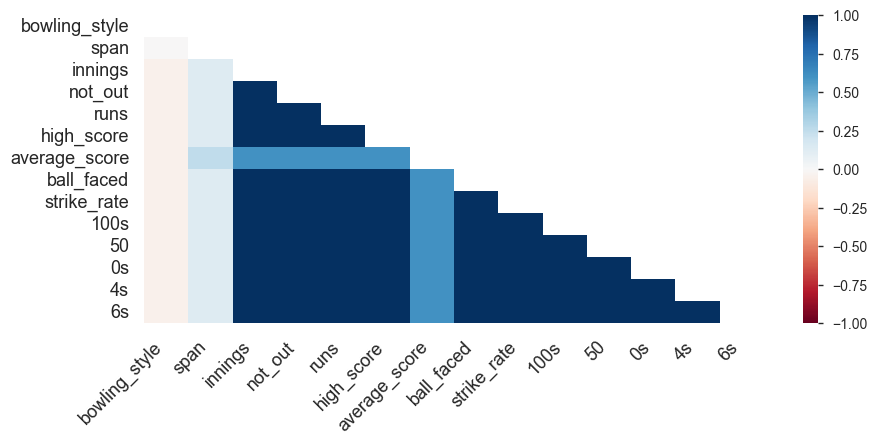

In [67]:
ODI_profile = ProfileReport(ODI_data, title="Pandas Profiling Report")
ODI_profile

### Finding count of Infinite Values for all columns

In [14]:
ODI_data[ODI_data == np.inf].sum()

player_id        0.0
name               0
gender             0
bating_style       0
bowling_style      0
playing_role       0
country_id       0.0
country            0
span               0
matches          0.0
innings          0.0
not_out          0.0
runs             0.0
high_score         0
average_score    0.0
ball_faced       0.0
strike_rate      0.0
100s             0.0
50               0.0
0s               0.0
4s               0.0
6s               0.0
dtype: object

### Plotting player counts with innings counts

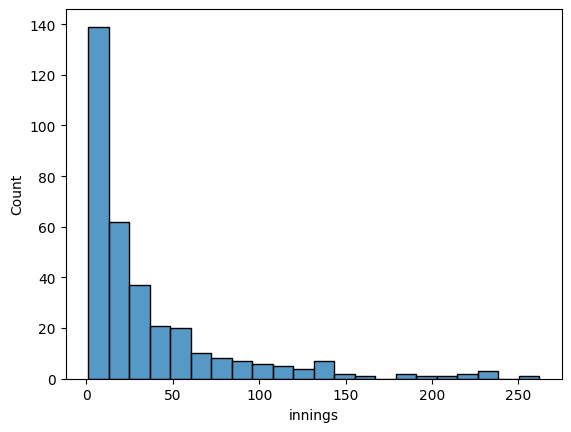

In [15]:

fig = sns.histplot(ODI_data, x="innings")


### Set cut-off number for innings played 

In [16]:
data=ODI_data[ODI_data.innings>=20][['player_id','name','span','bating_style','playing_role','country','matches','innings','runs','strike_rate','average_score','not_out', '100s', '50','4s','6s']]

In [17]:
data.shape

(158, 16)

### Calculating Years played

In [18]:
def calc_playing_time(f):
    start=int(f[:4])
    end=int(f[-4:])
    if end==start:
        val=1
    else:
        val=end-start
    return (val)



In [19]:
data['years_played']=data['span'].apply(calc_playing_time)

### Calculating a new metric using harmonic mean of strike rate and batting average

In [20]:
data["batting_score"]=2/((1/data["strike_rate"])+(1/data["average_score"]))

data['Runs_per_year']=data['runs']/data['years_played']
data['Runs_per_inning']=data['runs']/data['innings']


data['Runs_by_6s']=data['6s']*6
data['6s_runs_percentage']=(data['Runs_by_6s']/data['runs'])*100
data['Runs_by_4s']=data['4s']*4
data['4s_runs_percentage']=(data['Runs_by_4s']/data['runs'])*100


In [21]:
data.head()

,player_id,name,span,bating_style,playing_role,country,matches,innings,runs,strike_rate,...,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
1,380354,Anamul Haque,2012-2022,right-hand bat,wicketkeeper batter,Bangladesh,44,41.0,1254.0,74.15,...,122.0,27.0,10,43.301957,125.400000,30.585366,162.0,12.918660,488.0,38.915470
4,536936,Litton Das,2015-2022,right-hand bat,wicketkeeper batter,Bangladesh,60,60.0,1912.0,87.58,...,207.0,29.0,7,49.767546,273.142857,31.866667,174.0,9.100418,828.0,43.305439
6,56025,Mahmudullah,2007-2022,right-hand bat,allrounder,Bangladesh,215,187.0,4879.0,76.32,...,362.0,76.0,15,48.561694,325.266667,26.090909,456.0,9.346177,1448.0,29.678213
7,629063,Mehidy Hasan Miraz,2017-2022,right-hand bat,allrounder,Bangladesh,67,42.0,756.0,78.91,...,66.0,15.0,5,35.498261,151.200000,18.000000,90.0,11.904762,264.0,34.920635
10,373696,Mominul Haque,2012-2018,left-hand bat,middle-order batter,Bangladesh,28,26.0,557.0,74.36,...,60.0,1.0,6,34.286854,92.833333,21.423077,6.0,1.077199,240.0,43.087971


In [22]:
data.to_csv("ODI_Data.csv",index=False)

### Finding Numeric and Categorical Columns

In [23]:
numerical_features=data.select_dtypes(exclude="object").columns
categorical_features=data.select_dtypes(include="object").columns

### Outlier Analysis

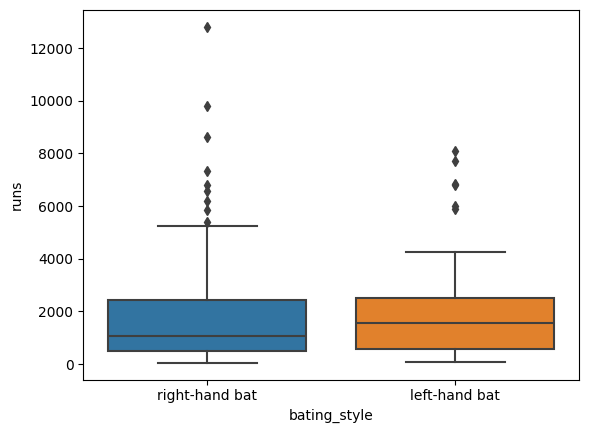

In [24]:
fig=sns.boxplot(x ='bating_style', y ="runs", data = data) 


In [25]:
z_score_df=pd.DataFrame()
for col in numerical_features:
    col_zscore = col + '_zscore'
    z_score_df[col_zscore] = (data[col] - data[col].mean())/data[col].std(ddof=0)

In [26]:
z_score_df

,player_id_zscore,matches_zscore,innings_zscore,runs_zscore,strike_rate_zscore,average_score_zscore,not_out_zscore,100s_zscore,50_zscore,4s_zscore,6s_zscore,years_played_zscore,batting_score_zscore,Runs_per_year_zscore,Runs_per_inning_zscore,Runs_by_6s_zscore,6s_runs_percentage_zscore,Runs_by_4s_zscore,4s_runs_percentage_zscore
1,-0.080513,-0.703412,-0.516904,-0.315776,-0.647135,0.118002,-1.120412,-0.057116,-0.437209,-0.257574,-0.195391,0.389337,0.099870,-0.541680,0.485784,-0.195391,0.164273,-0.257574,0.683437
4,0.569335,-0.414973,-0.155529,-0.014415,0.273845,0.434429,-0.646576,0.265182,-0.282497,0.149584,-0.148968,-0.392637,0.515548,0.263899,0.586850,-0.148968,-0.385455,0.149584,1.395498
6,-1.426545,2.379280,2.259979,1.344455,-0.498324,0.498774,3.617948,-0.057116,1.264626,0.892050,0.941992,1.692627,0.438023,0.548107,0.131273,0.941992,-0.350072,0.892050,-0.814863
7,0.951681,-0.288781,-0.497884,-0.543857,-0.320711,-0.463377,-0.267507,-0.379415,-0.669278,-0.525819,-0.473934,-0.913953,-0.401837,-0.401003,-0.506916,-0.473934,0.018298,-0.525819,0.035467
10,-0.108145,-0.991851,-0.802200,-0.634998,-0.632734,-0.510312,-1.025645,-0.540564,-0.591921,-0.554560,-0.798901,-0.653295,-0.479720,-0.719252,-0.236913,-0.798901,-1.540591,-0.554560,1.360224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
327,-0.408869,0.792865,0.719380,0.572734,-0.776058,0.430644,0.206329,0.104033,0.800489,0.336398,-0.241815,0.128679,0.330964,0.709625,0.450030,-0.241815,-1.019533,0.336398,-0.631648
330,-0.713809,0.612591,0.434083,0.170157,0.292361,0.342832,0.964466,-0.218266,0.026928,-0.008489,-0.543570,1.431969,0.437676,-0.323811,0.079897,-0.543570,-1.247898,-0.008489,-0.752159
332,2.171344,-0.541165,-0.707101,-0.617136,-0.245963,-0.048539,-0.172740,-0.540564,-0.514565,-0.674312,-0.543570,-0.913953,0.009546,-0.575486,-0.410228,-0.543570,0.043605,-0.674312,-1.818614
339,-0.335788,-0.847632,-0.631022,-0.322646,0.738792,0.733446,-0.836111,-0.057116,-0.282497,-0.214463,-0.311451,-1.695926,0.845426,2.152435,0.865550,-0.311451,-0.161815,-0.214463,1.231144


In [27]:
IQR = data['runs'].quantile(0.75)-data['runs'].quantile(0.25)


In [28]:
upper_boundary = data['runs'].quantile(0.75) + (IQR * 1.5)
lower_boundary = data['runs'].quantile(0.25) + (IQR * 1.5)
print(upper_boundary)
print(lower_boundary)


5355.875
3430.125


In [29]:

data[data['runs']>upper_boundary].sort_values('runs',ascending=False)


,player_id,name,span,bating_style,playing_role,country,matches,innings,runs,strike_rate,...,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
199,253802,V Kohli,2008-2023,right-hand bat,top-order batter,India,271,262.0,12809.0,93.77,...,1204.0,137.0,15,71.432607,853.933333,48.889313,822.0,6.417363,4816.0,37.598564
274,34102,RG Sharma,2007-2023,right-hand bat,top-order batter,India,241,234.0,9782.0,89.89,...,896.0,273.0,16,63.350431,611.375000,41.803419,1638.0,16.745042,3584.0,36.638724
292,38699,LRPL Taylor,2006-2022,right-hand bat,middle-order batter,New Zealand,236,220.0,8607.0,83.32,...,713.0,147.0,16,60.546588,537.937500,39.122727,882.0,10.247473,2852.0,33.135820
140,56194,Tamim Iqbal,2007-2022,left-hand bat,opening batter,Bangladesh,231,229.0,8074.0,78.65,...,890.0,101.0,15,50.352861,538.266667,35.257642,606.0,7.505573,3560.0,44.092148
207,24598,EJG Morgan,2006-2022,left-hand bat,middle-order batter,England,248,230.0,7701.0,91.16,...,654.0,220.0,16,54.912632,481.312500,33.482609,1320.0,17.140631,2616.0,33.969614
52,226492,MJ Guptill,2009-2022,right-hand bat,opening batter,New Zealand,198,195.0,7346.0,87.29,...,750.0,187.0,13,56.465846,565.076923,37.671795,1122.0,15.273618,3000.0,40.838552
136,56143,Shakib Al Hasan,2006-2022,left-hand bat,allrounder,Bangladesh,224,212.0,6835.0,82.15,...,619.0,46.0,16,51.541061,427.187500,32.240566,276.0,4.038040,2476.0,36.225311
12,56029,Mushfiqur Rahim,2006-2022,right-hand bat,wicketkeeper batter,Bangladesh,239,224.0,6811.0,78.77,...,535.0,85.0,16,49.809938,425.687500,30.406250,510.0,7.487887,2140.0,31.419762
191,28235,S Dhawan,2010-2022,left-hand bat,opening batter,India,167,164.0,6793.0,91.35,...,842.0,79.0,12,59.492817,566.083333,41.420732,474.0,6.977771,3368.0,49.580450
294,277906,KS Williamson,2010-2023,right-hand bat,top-order batter,New Zealand,161,153.0,6554.0,80.97,...,594.0,51.0,13,60.136570,504.153846,42.836601,306.0,4.668904,2376.0,36.252670


In [30]:
data[data['runs']<lower_boundary].sort_values('runs',ascending=True)


,player_id,name,span,bating_style,playing_role,country,matches,innings,runs,strike_rate,...,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
188,625383,JJ Bumrah,2016-2022,right-hand bat,bowler,India,72,20.0,47.0,50.53,...,5.0,1.0,6,11.846831,7.833333,2.350000,6.0,12.765957,20.0,42.553191
113,827051,B Muzarabani,2018-2022,right-hand bat,bowler,Zimbabwe,33,27.0,64.0,35.75,...,5.0,1.0,4,6.142675,16.000000,2.370370,6.0,9.375000,20.0,31.250000
282,376116,UT Yadav,2010-2018,right-hand bat,bowler,India,75,24.0,79.0,58.95,...,8.0,1.0,8,13.932835,9.875000,3.291667,6.0,7.594937,32.0,40.506329
153,288284,JR Hazlewood,2010-2022,left-hand bat,bowler,Australia,69,23.0,81.0,77.88,...,8.0,1.0,12,32.142464,6.750000,3.521739,6.0,7.407407,32.0,39.506173
268,364343,CA Young,2014-2022,right-hand bat,bowler,Ireland,36,22.0,82.0,74.54,...,7.0,2.0,8,12.513413,10.250000,3.727273,12.0,14.634146,28.0,34.146341
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,311158,BA Stokes,2011-2022,left-hand bat,allrounder,England,105,90.0,2924.0,95.08,...,238.0,88.0,11,55.291935,265.818182,32.488889,528.0,18.057456,952.0,32.558140
100,55412,CR Ervine,2010-2023,left-hand bat,middle-order batter,Zimbabwe,107,103.0,2948.0,75.01,...,275.0,37.0,13,45.243462,226.769231,28.621359,222.0,7.530529,1100.0,37.313433
28,25913,Mohammad Nabi,2009-2022,right-hand bat,allrounder,Afghanistan,136,121.0,2968.0,85.33,...,189.0,92.0,13,41.571995,228.307692,24.528926,552.0,18.598383,756.0,25.471698
35,533956,Rahmat Shah,2013-2022,right-hand bat,allrounder,Afghanistan,88,84.0,3083.0,70.50,...,265.0,35.0,9,49.433125,342.555556,36.702381,210.0,6.811547,1060.0,34.382095


### Runs Destribution Across Nationalities

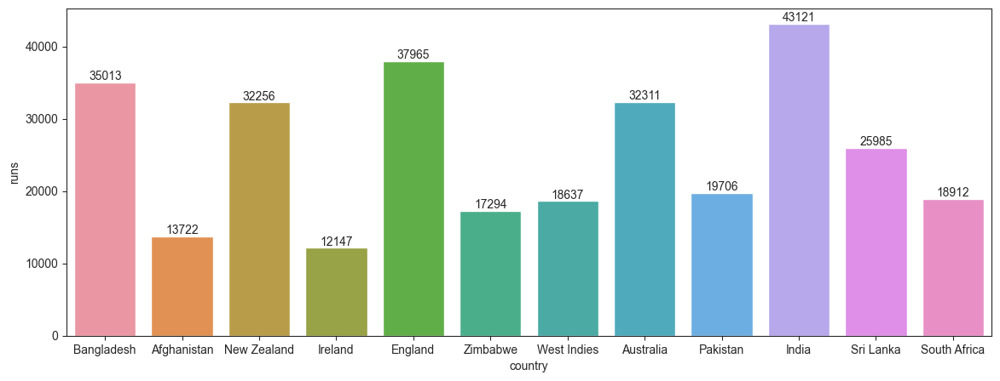

In [31]:
sns.set_style('ticks')
plt.figure(figsize =(14, 5))
g=sns.barplot(data,x='country',y='runs',estimator=sum,errorbar=None)
for i in g.containers:
    g.bar_label(i,)

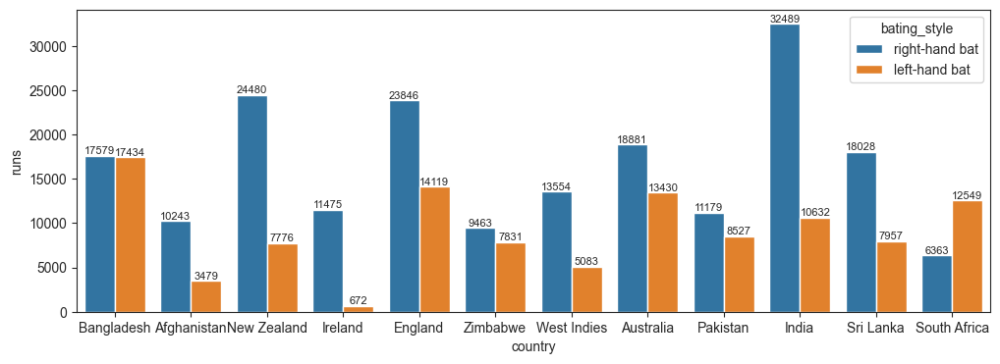

In [32]:
sns.set_style('ticks')
plt.figure(figsize =(12, 4))
g=sns.barplot(data,x='country',y='runs',hue='bating_style',estimator=sum,errorbar=None)
for i in g.containers:
    g.bar_label(i,fontsize=8)

### Runs Destribution Across Playing role

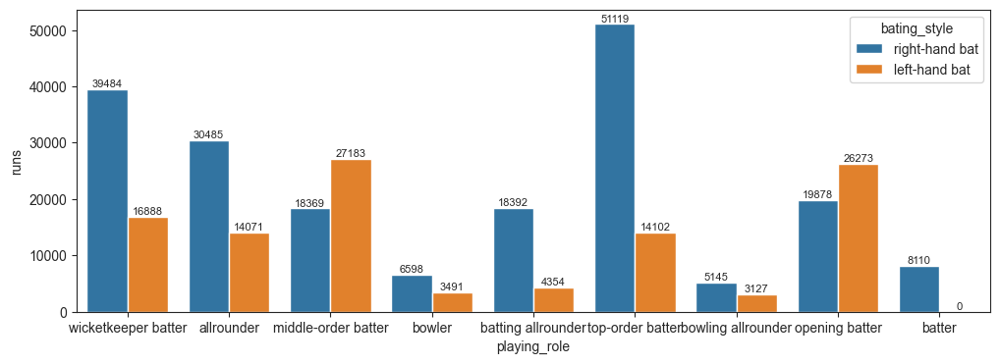

In [33]:
sns.set_style('ticks')
plt.figure(figsize =(12, 4))
g=sns.barplot(data,x='playing_role',y='runs',hue='bating_style',estimator=sum,errorbar=None)
for i in g.containers:
    g.bar_label(i,fontsize=8)

In [34]:
pivot_table=pd.pivot_table(data=data,index=['bating_style','playing_role'],aggfunc={'runs' : 'sum', 'average_score' : 'mean','player_id':'count'})

In [35]:
pivot_table.reset_index(inplace=True)

In [36]:
pivot_table

,bating_style,playing_role,average_score,player_id,runs
0,left-hand bat,allrounder,32.244000,5,14071.0
1,left-hand bat,batting allrounder,31.716667,3,4354.0
2,left-hand bat,bowler,13.434545,11,3491.0
3,left-hand bat,bowling allrounder,21.452000,5,3127.0
4,left-hand bat,middle-order batter,34.231000,10,27183.0
5,left-hand bat,opening batter,39.380000,6,26273.0
6,left-hand bat,top-order batter,38.622500,8,14102.0
7,left-hand bat,wicketkeeper batter,34.902857,7,16888.0
8,right-hand bat,allrounder,28.276471,17,30485.0
9,right-hand bat,batter,41.993333,3,8110.0


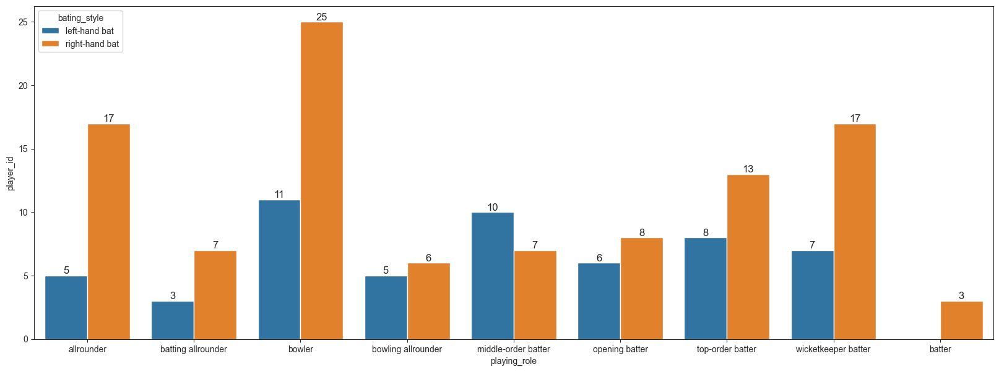

In [37]:
sns.set_style('ticks')
plt.figure(figsize =(20, 7))
g=sns.barplot(pivot_table,x='playing_role',y='player_id',hue='bating_style',errorbar=None)
for i in g.containers:
    g.bar_label(i,fontsize=12)

### Distribution of Strike rate, batitng_average and batting_score

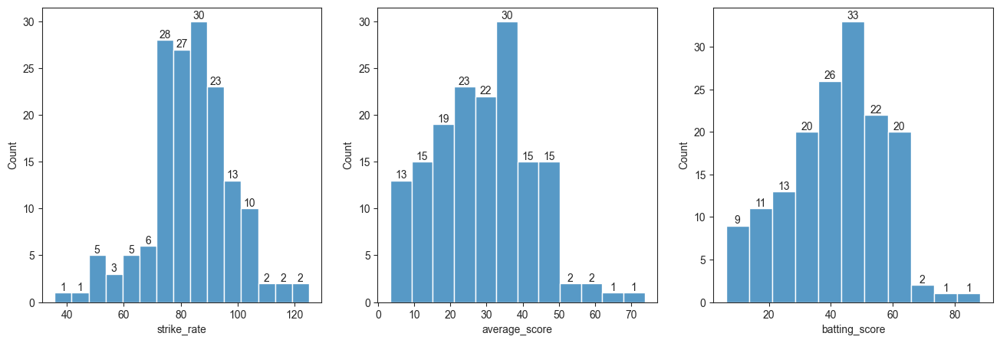

In [38]:
fig, axs = plt.subplots(ncols=3,figsize=(16, 5))

g1=sns.histplot(x='strike_rate', data=data, ax=axs[0])
for i in g1.containers:
    g1.bar_label(i,)
g2=sns.histplot(x='average_score', data=data, ax=axs[1])
for i in g2.containers:
    g2.bar_label(i,)
g3=sns.histplot(x='batting_score', data=data, ax=axs[2])
for i in g3.containers:
    g3.bar_label(i,)


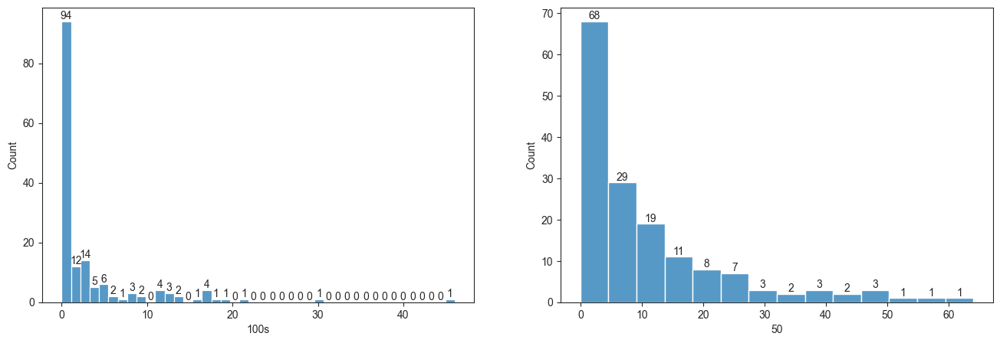

In [39]:
fig, axs = plt.subplots(ncols=2,figsize=(16, 5))

g1=sns.histplot(x='100s', data=data, ax=axs[0])
for i in g1.containers:
    g1.bar_label(i,)
g2=sns.histplot(x='50', data=data, ax=axs[1])
for i in g2.containers:
    g2.bar_label(i,)



In [40]:
data.playing_role.value_counts().index

Index(['bowler', 'wicketkeeper batter', 'allrounder', 'top-order batter',
       'middle-order batter', 'opening batter', 'bowling allrounder',
       'batting allrounder', 'batter'],
      dtype='object', name='playing_role')

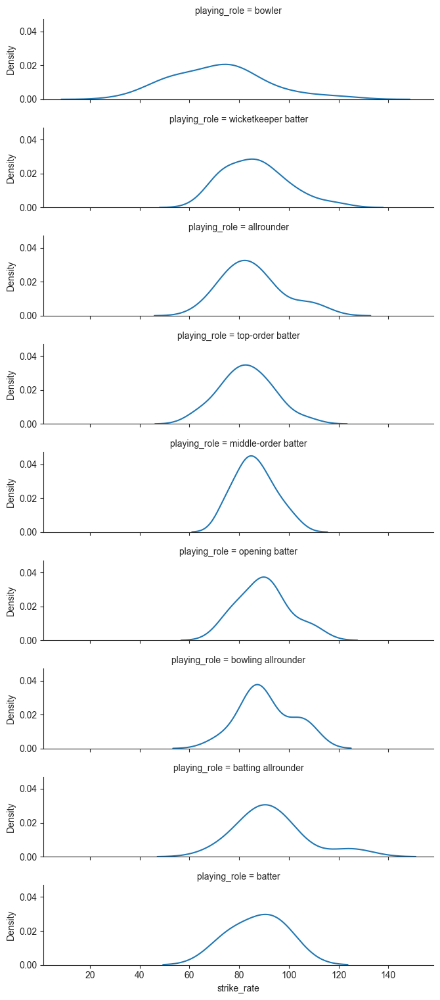

In [41]:
cats = data.playing_role.value_counts().index
sea = sns.FacetGrid(data, row = "playing_role", 
                    row_order = cats,
                    height = 1.7, aspect = 4)
 
sea.map(sns.kdeplot, "strike_rate")

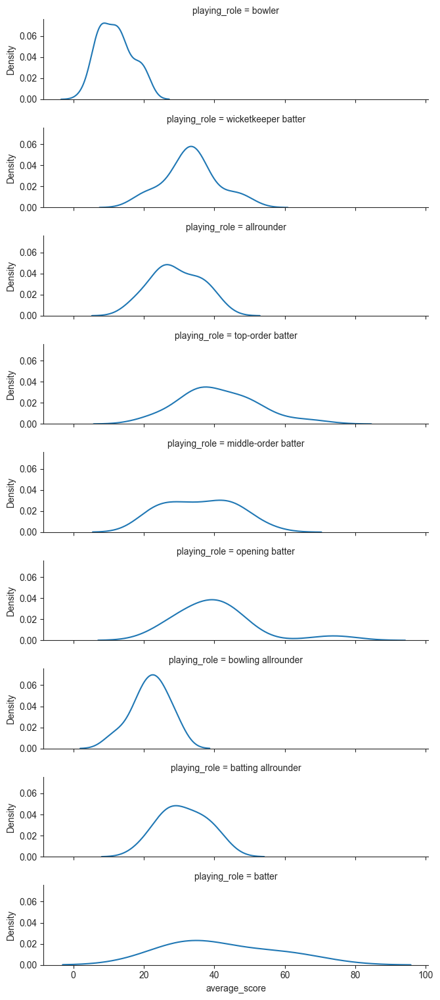

In [42]:
cats = data.playing_role.value_counts().index
sea = sns.FacetGrid(data, row = "playing_role", 
                    row_order = cats,
                    height = 1.7, aspect = 4)
 
sea.map(sns.kdeplot, "average_score")

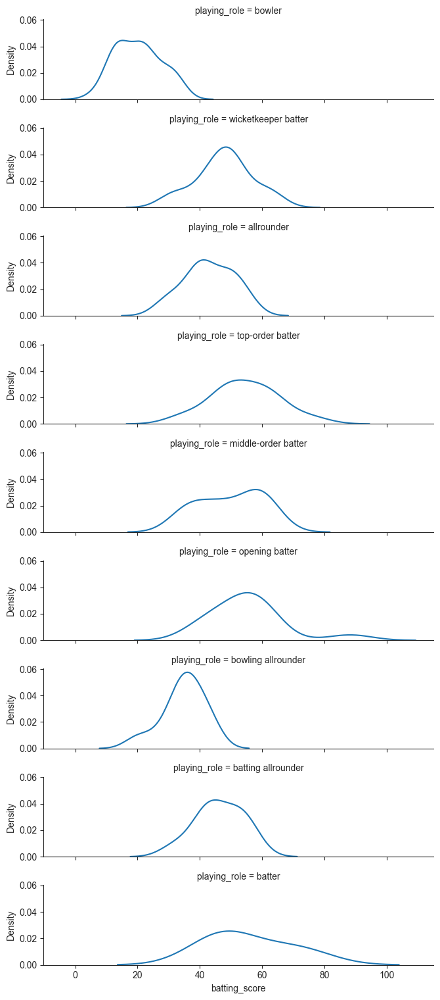

In [43]:
cats = data.playing_role.value_counts().index
sea = sns.FacetGrid(data, row = "playing_role", 
                    row_order = cats,
                    height = 1.7, aspect = 4)
 
sea.map(sns.kdeplot, "batting_score")

### Performance analysis with time played

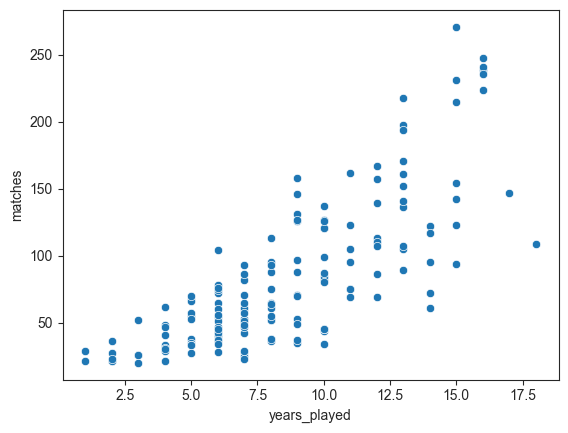

In [44]:
g=sns.scatterplot(data=data,x="years_played",y="matches")

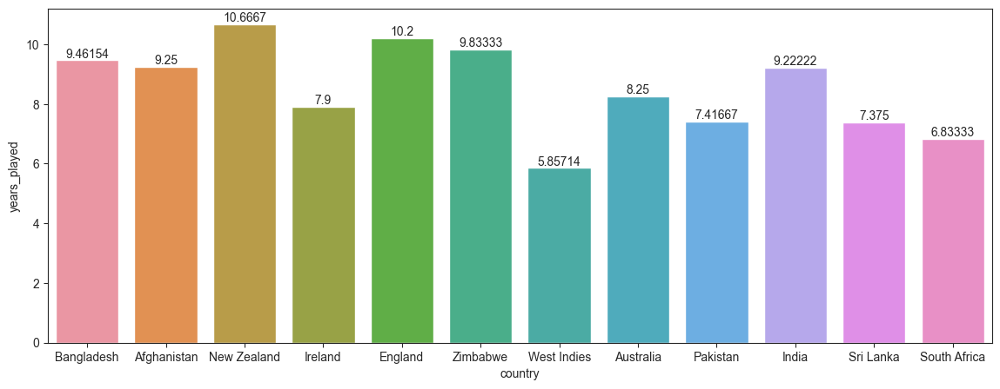

In [45]:
sns.set_style('ticks')
plt.figure(figsize =(14, 5))
g=sns.barplot(data,x='country',y='years_played',estimator=np.mean,errorbar=None)
for i in g.containers:
    g.bar_label(i,)

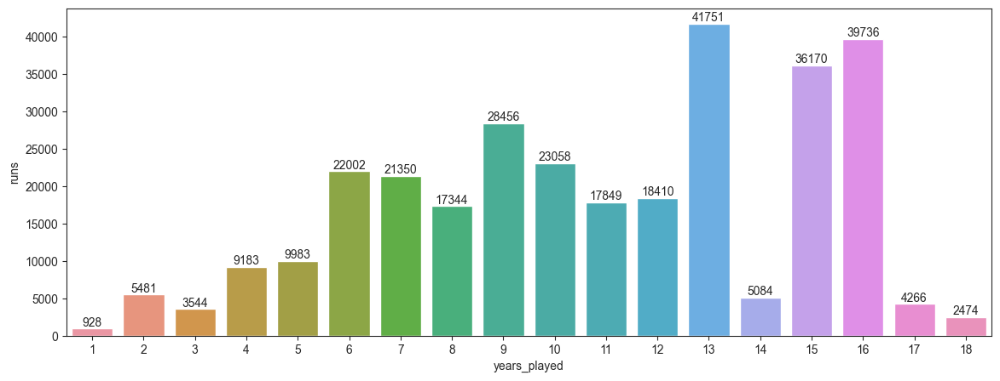

In [46]:
sns.set_style('ticks')
plt.figure(figsize =(14, 5))
g=sns.barplot(data,x='years_played',y='runs',estimator=sum,errorbar=None)
for i in g.containers:
    g.bar_label(i,)

In [47]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


In [48]:
data.head()

,player_id,name,span,bating_style,playing_role,country,matches,innings,runs,strike_rate,...,4s,6s,years_played,batting_score,Runs_per_year,Runs_per_inning,Runs_by_6s,6s_runs_percentage,Runs_by_4s,4s_runs_percentage
1,380354,Anamul Haque,2012-2022,right-hand bat,wicketkeeper batter,Bangladesh,44,41.0,1254.0,74.15,...,122.0,27.0,10,43.301957,125.400000,30.585366,162.0,12.918660,488.0,38.915470
4,536936,Litton Das,2015-2022,right-hand bat,wicketkeeper batter,Bangladesh,60,60.0,1912.0,87.58,...,207.0,29.0,7,49.767546,273.142857,31.866667,174.0,9.100418,828.0,43.305439
6,56025,Mahmudullah,2007-2022,right-hand bat,allrounder,Bangladesh,215,187.0,4879.0,76.32,...,362.0,76.0,15,48.561694,325.266667,26.090909,456.0,9.346177,1448.0,29.678213
7,629063,Mehidy Hasan Miraz,2017-2022,right-hand bat,allrounder,Bangladesh,67,42.0,756.0,78.91,...,66.0,15.0,5,35.498261,151.200000,18.000000,90.0,11.904762,264.0,34.920635
10,373696,Mominul Haque,2012-2018,left-hand bat,middle-order batter,Bangladesh,28,26.0,557.0,74.36,...,60.0,1.0,6,34.286854,92.833333,21.423077,6.0,1.077199,240.0,43.087971


In [49]:
clust_data=data[numerical_features]

In [50]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(clust_data)

In [51]:
inertia = []
for n_clusters in range(1, 11):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)

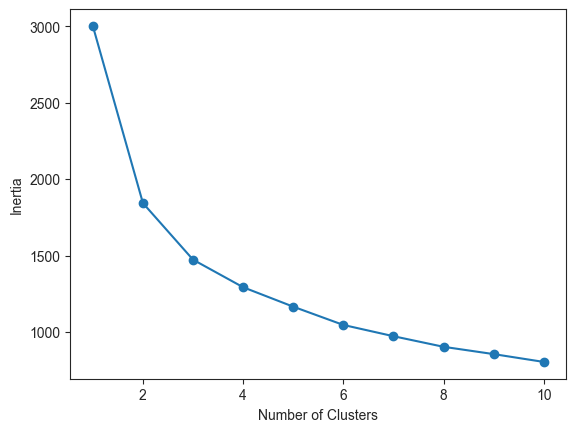

In [52]:
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

In [53]:
n_clusters = 3

In [54]:
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(scaled_data)
clust_data['cluster'] = clusters


In [55]:
cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
centroid_df = pd.DataFrame(cluster_centers, columns=clust_data.columns[:-1]) 

In [56]:
print("Cluster Centroids:")
print(centroid_df)

Cluster Centroids:
       player_id     matches     innings         runs  strike_rate  \
0  470567.612903   65.725806   39.225806   448.758065    76.431774   
1  198987.576923  173.346154  162.807692  6101.115385    90.702692   
2  411603.014286   64.785714   58.671429  1723.100000    87.280857   

   average_score    not_out       100s         50          4s          6s  \
0      16.091613  12.887097   0.064516   1.274194   35.870968    9.854839   
1      43.294615  21.461538  14.038462  34.615385  573.115385  104.884615   
2      35.171571   7.300000   2.300000  10.057143  152.100000   32.257143   

   years_played  batting_score  Runs_per_year  Runs_per_inning  Runs_by_6s  \
0      7.919355      26.126516      66.798613        11.400439   59.129032   
1     12.615385      58.131414     494.339097        37.812410  629.307692   
2      7.500000      49.500155     264.503012        30.992273  193.542857   

   6s_runs_percentage   Runs_by_4s  4s_runs_percentage  
0           12.961848

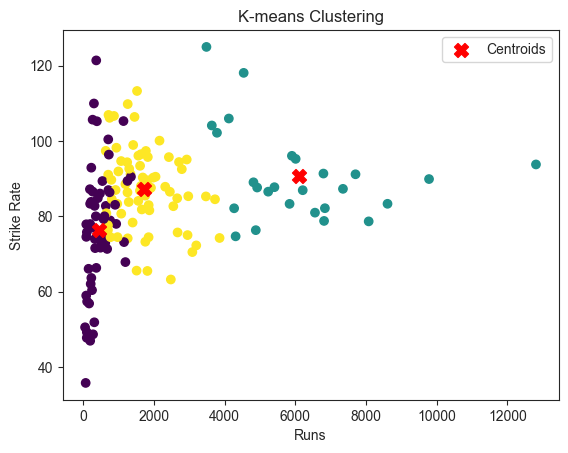

In [57]:
plt.scatter(clust_data['runs'], clust_data['strike_rate'], c=clust_data['cluster'], cmap='viridis')
plt.scatter(centroid_df['runs'], centroid_df['strike_rate'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('Strike Rate')
plt.title('K-means Clustering')
plt.legend()
plt.show()

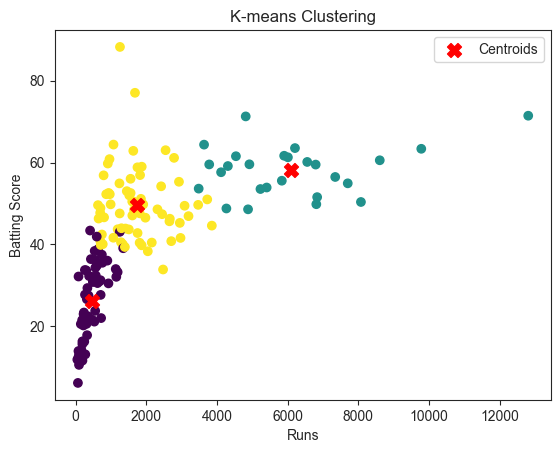

In [58]:
plt.scatter(clust_data['runs'], clust_data['batting_score'], c=clust_data['cluster'], cmap='viridis')
plt.scatter(centroid_df['runs'], centroid_df['batting_score'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('Batting Score')
plt.title('K-means Clustering')
plt.legend()
plt.show()

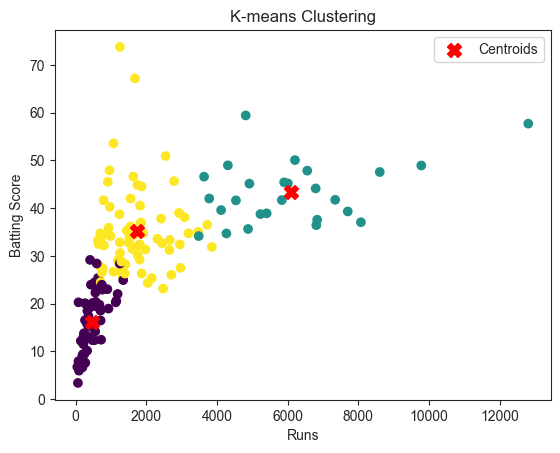

In [59]:
plt.scatter(clust_data['runs'], clust_data['average_score'], c=clust_data['cluster'], cmap='viridis')
plt.scatter(centroid_df['runs'], centroid_df['average_score'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('Batting Score')
plt.title('K-means Clustering')
plt.legend()
plt.show()

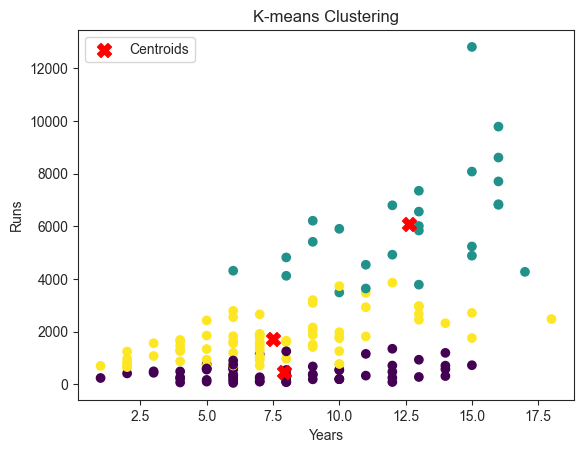

In [60]:
plt.scatter(clust_data['years_played'], clust_data['runs'], c=clust_data['cluster'], cmap='viridis')
plt.scatter(centroid_df['years_played'], centroid_df['runs'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Years')
plt.ylabel('Runs')
plt.title('K-means Clustering')
plt.legend()
plt.show()

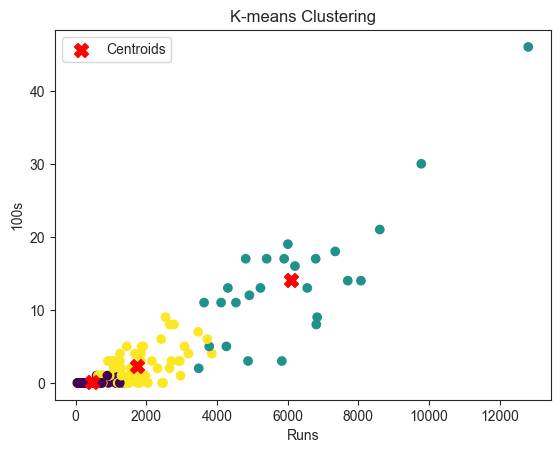

In [61]:
plt.scatter(clust_data['runs'], clust_data['100s'], c=clust_data['cluster'], cmap='viridis')
plt.scatter(centroid_df['runs'], centroid_df['100s'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('100s')
plt.title('K-means Clustering')
plt.legend()
plt.show()

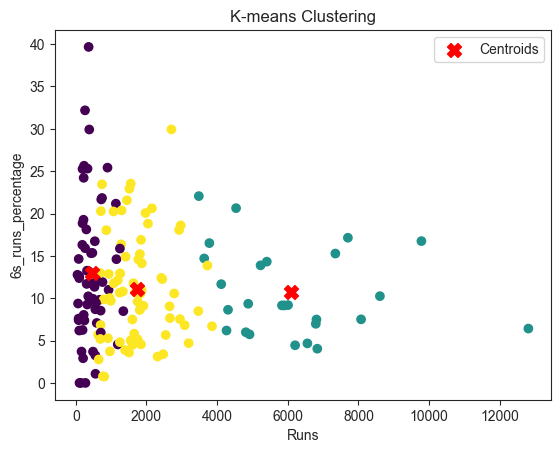

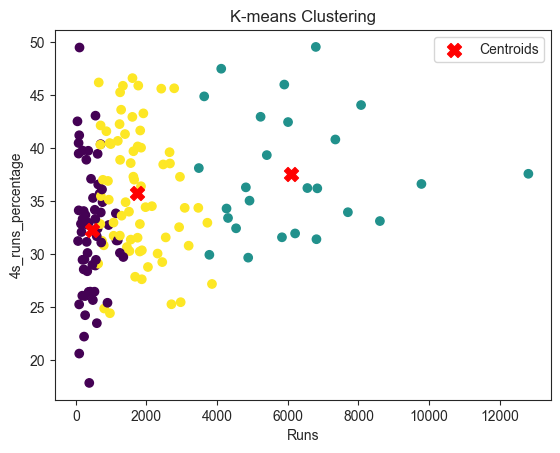

In [62]:
plt.scatter(clust_data['runs'], clust_data['6s_runs_percentage'], c=clust_data['cluster'], cmap='viridis')
plt.scatter(centroid_df['runs'], centroid_df['6s_runs_percentage'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('6s_runs_percentage')
plt.title('K-means Clustering')
plt.legend()
plt.show()
plt.scatter(clust_data['runs'], clust_data['4s_runs_percentage'], c=clust_data['cluster'], cmap='viridis')
plt.scatter(centroid_df['runs'], centroid_df['4s_runs_percentage'], marker='X', s=100, c='red', label='Centroids')
plt.xlabel('Runs')
plt.ylabel('4s_runs_percentage')
plt.title('K-means Clustering')
plt.legend()
plt.show()

Overall Silhouette Score: 0.23290786120897275


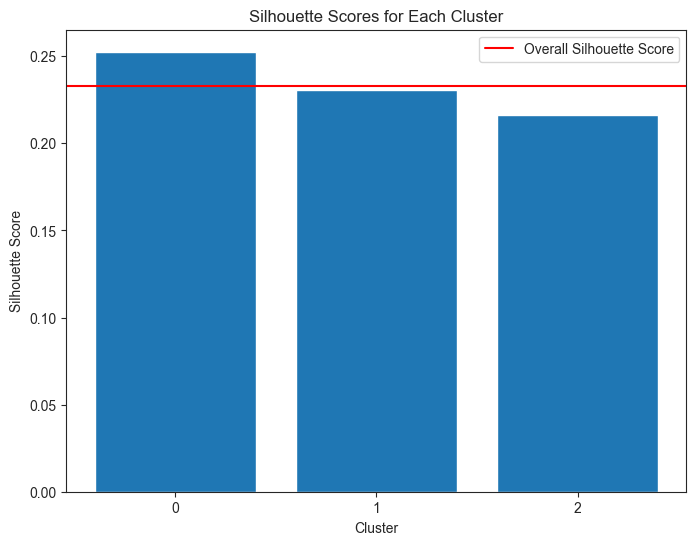

In [64]:
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.pyplot as plt
import numpy as np



silhouette_scores = silhouette_samples(scaled_data, clusters)

overall_silhouette_score = silhouette_score(scaled_data, clusters)


print("Overall Silhouette Score:", overall_silhouette_score)


cluster_silhouette_scores = []
for cluster in np.unique(clusters):
    cluster_silhouette_avg = np.mean(silhouette_scores[clusters == cluster])
    cluster_silhouette_scores.append(cluster_silhouette_avg)


plt.figure(figsize=(8, 6))
plt.bar(range(len(cluster_silhouette_scores)), cluster_silhouette_scores)
plt.xlabel('Cluster')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Each Cluster')
plt.xticks(range(len(cluster_silhouette_scores)))
plt.axhline(y=overall_silhouette_score, color="red", linestyle="-", label='Overall Silhouette Score')
plt.legend()
plt.show()

In [66]:
cluster_silhouette_scores

[0.25261080060972374, 0.23044069342883822, 0.21637306291521483]